In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import zlib
import io
from IPython.display import display, Image, update_display, HTML
from torch.utils.data import DataLoader
from datasets import load_dataset
from compressai.models import CompressionModel
from compressai.entropy_models import EntropyBottleneck
from compressai.models.utils import conv, deconv
from compressai.layers import GDN1, conv1x1, conv3x3, AttentionBlock
from torch import Tensor
from torchvision.transforms import ToPILImage, CenterCrop, Resize
from fastprogress.fastprogress import master_bar, progress_bar
from piqa import LPIPS

In [2]:
train_dataset = load_dataset("danjacobellis/aria_ea_rgb_100k", split="train").with_format("torch")
valid_dataset = load_dataset("danjacobellis/aria_ea_rgb_100k", split="validation").with_format("torch")

Resolving data files:   0%|          | 0/70 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/18 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/70 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/18 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/83 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/70 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/18 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/70 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/18 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/18 [00:00<?, ?it/s]

In [4]:
class ResidualBottleneckBlock(nn.Module):

    def __init__(self, in_ch: int, out_ch: int):
        super().__init__()
        mid_ch = min(in_ch, out_ch) // 2
        self.conv1 = conv1x1(in_ch, mid_ch)
        self.relu1 = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(mid_ch, mid_ch)
        self.relu2 = nn.ReLU(inplace=True)
        self.conv3 = conv1x1(mid_ch, out_ch)
        self.skip = conv1x1(in_ch, out_ch) if in_ch != out_ch else nn.Identity()

    def forward(self, x: Tensor) -> Tensor:
        identity = self.skip(x)

        out = x
        out = self.conv1(out)
        out = self.relu1(out)
        out = self.conv2(out)
        out = self.relu2(out)
        out = self.conv3(out)

        return out + identity
        
class RateDistortionAutoEncoder(CompressionModel):
    def __init__(self, N=128):
        super().__init__()
        self.entropy_bottleneck = EntropyBottleneck(N)
        
        self.encode = nn.Sequential(
            nn.AvgPool2d(stride=2, kernel_size=2),
            nn.Conv2d(3, 8, stride=2, kernel_size=5, padding=2),
            GDN1(8),
            nn.Conv2d(8, 24, stride=2, kernel_size=5, padding=2),
            GDN1(24),
            nn.Conv2d(24, 72, stride=2, kernel_size=5, padding=2),
            GDN1(72),
            nn.Conv2d(72, N, stride=2, kernel_size=5, padding=2),
        )
        self.decode = nn.Sequential(
            AttentionBlock(N),
            deconv(N, N, kernel_size=5, stride=2),
            ResidualBottleneckBlock(N, N),
            ResidualBottleneckBlock(N, N),
            ResidualBottleneckBlock(N, N),
            deconv(N, N, kernel_size=5, stride=2),
            AttentionBlock(N),
            ResidualBottleneckBlock(N, N),
            ResidualBottleneckBlock(N, N),
            ResidualBottleneckBlock(N, N),
            deconv(N, N, kernel_size=5, stride=2),
            ResidualBottleneckBlock(N, N),
            ResidualBottleneckBlock(N, N),
            ResidualBottleneckBlock(N, N),
            deconv(N, 3, kernel_size=5, stride=2),
            nn.Upsample(scale_factor=2,mode="bilinear"),
            torch.nn.Hardtanh(min_val=-0.5, max_val=0.5),
        )
        
    def forward(self, x):
        y = self.encode(x)
        y_hat, y_likelihoods = self.entropy_bottleneck(y)
        x_hat = self.decode(y_hat)
        return x_hat, y_likelihoods

In [5]:
model = RateDistortionAutoEncoder().to("cuda")
parameters = set(p for n, p in model.named_parameters() if not n.endswith(".quantiles"))
aux_parameters = set(p for n, p in model.named_parameters() if n.endswith(".quantiles"))
optimizer = optim.Adam(parameters, lr=1e-4)
aux_optimizer = optim.Adam(aux_parameters, lr=1e-3)
λ = 0.01
lpips = LPIPS().cuda()

In [6]:
sum(p.numel() for p in model.parameters())

2688363

In [7]:
pil = ToPILImage()
valid_batch = valid_dataset[[1000,3000,6000]]['image'].to("cuda")
valid_batch = valid_batch.to(torch.float)
valid_batch = valid_batch/255
valid_batch = valid_batch - 0.5
valid_batch = valid_batch.permute(0, 3, 1, 2)
valid_batch = valid_batch.rot90(k=3,dims=[2,3])

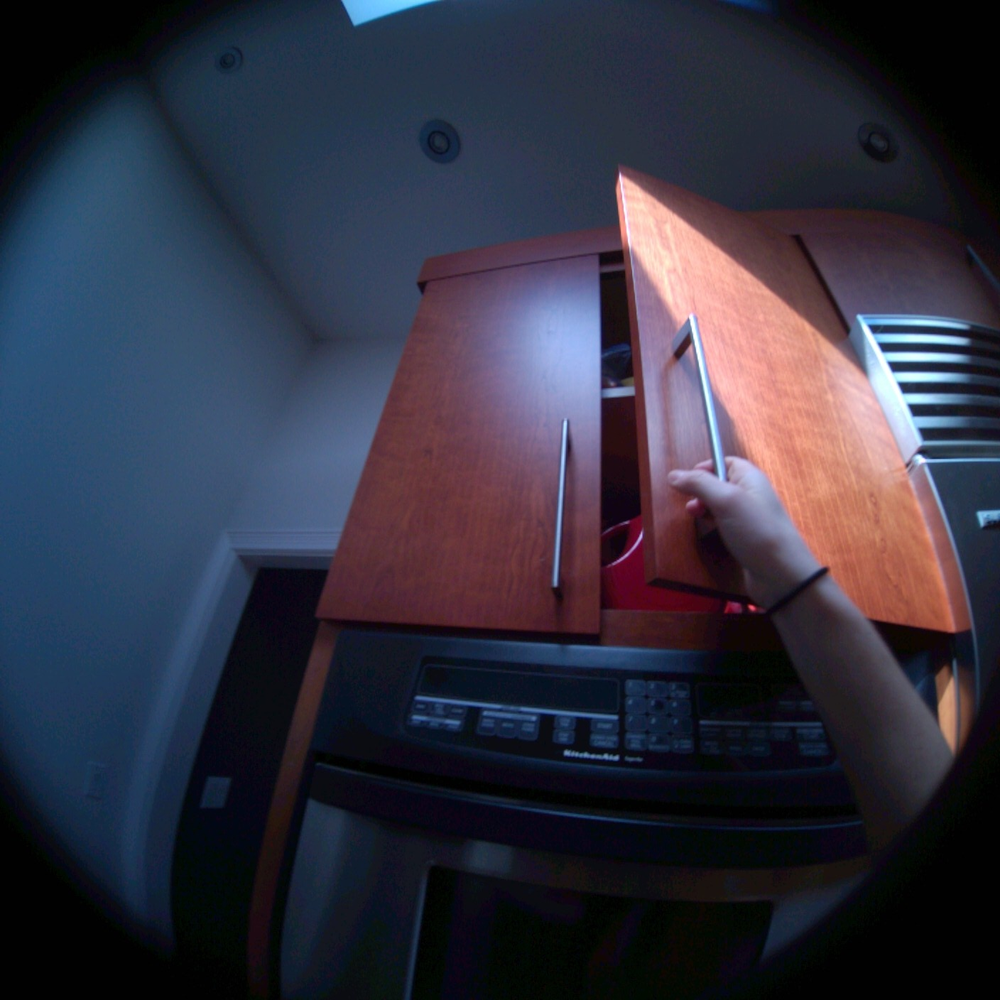

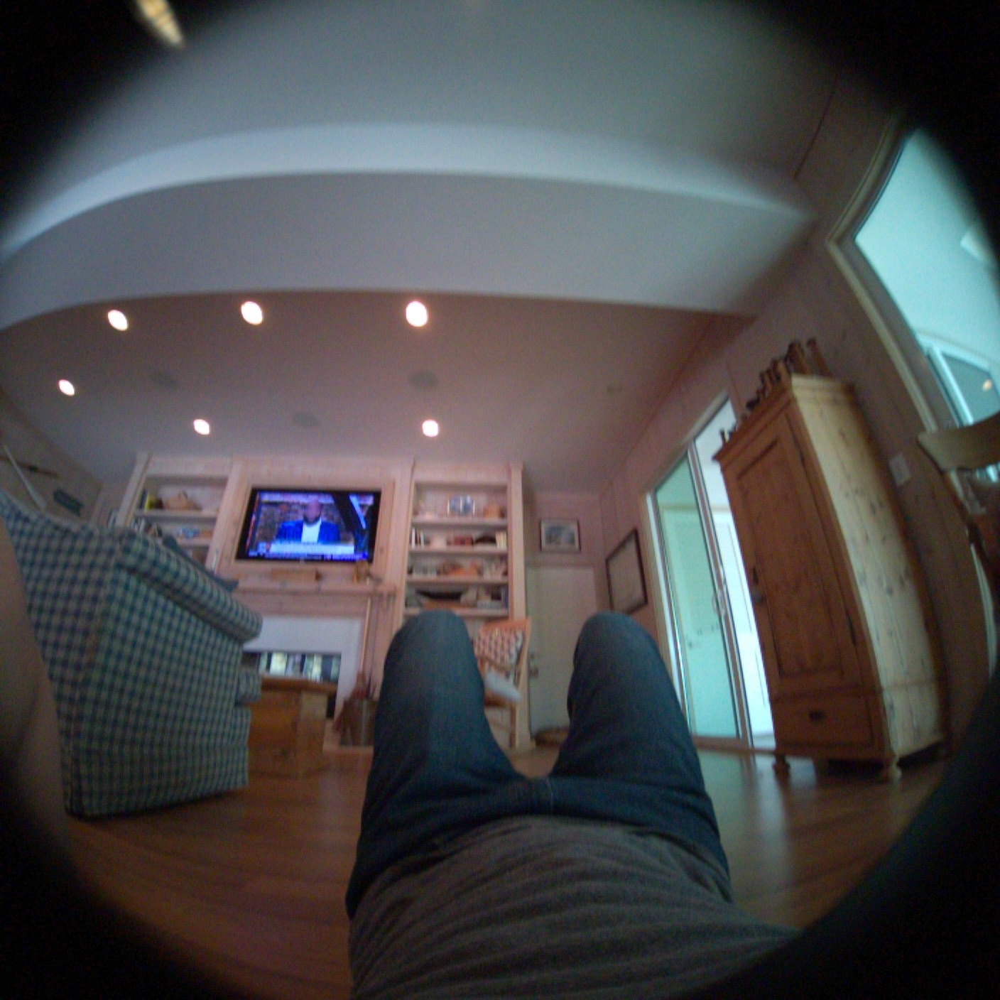

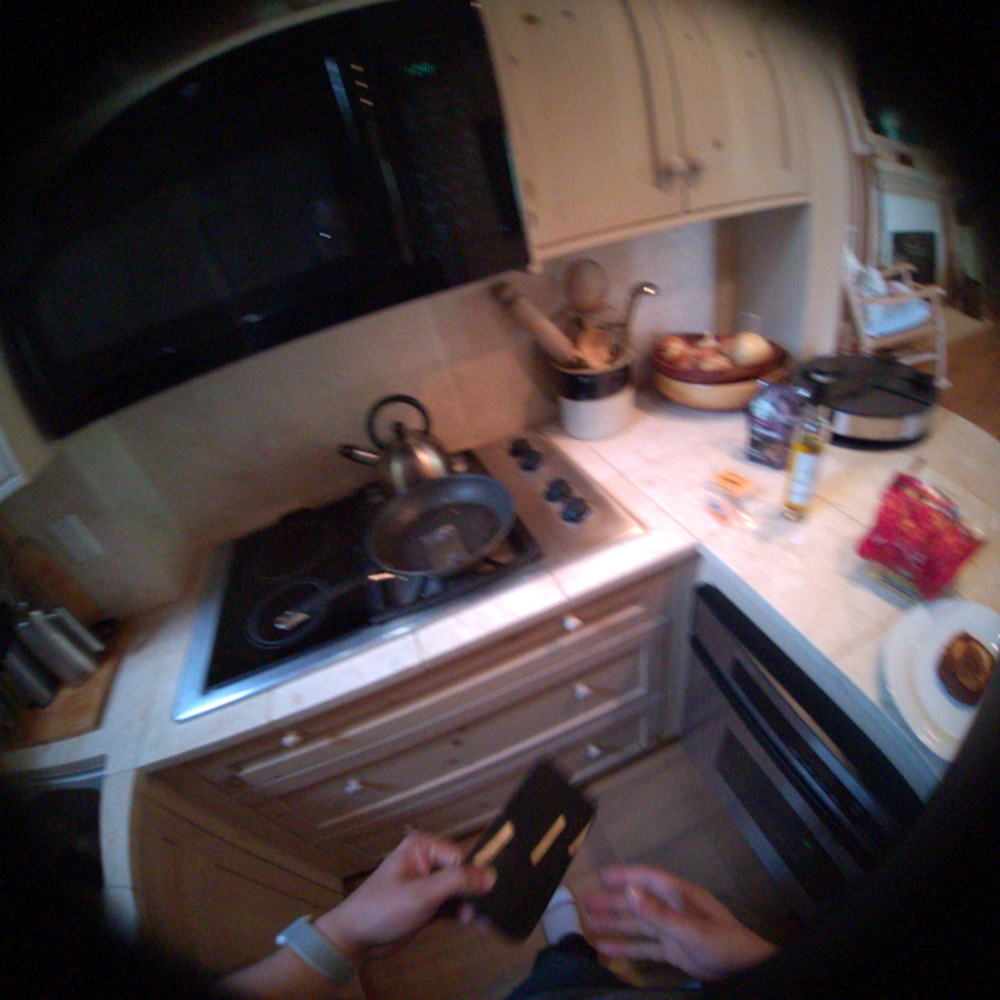

In [8]:
for img in valid_batch:
    display(pil(img+0.5))

In [9]:
def lossy_analysis_transform(x):
    z = model.encode(x).round().to(torch.int8).detach().cpu().numpy()
    return z
    
def lossless_entropy_encode(z):
    original_shape = z.shape
    compressed_img = zlib.compress(z.tobytes(), level=9)
    return compressed_img, original_shape

def compress(img):
    z = lossy_analysis_transform(img)
    compressed_img, original_shape = lossless_entropy_encode(z)
    return compressed_img, original_shape

In [10]:
def entropy_decoder(compressed_img,original_shape):
    decompressed = zlib.decompress(compressed_img)
    ẑ = np.frombuffer(decompressed, dtype=np.int8)
    ẑ = ẑ.reshape(original_shape)
    return ẑ
    
def synthesis_transform(ẑ):
    ẑ = torch.tensor(ẑ).to(torch.float).cuda()
    x̂ = model.decode(ẑ).detach().cpu()
    return x̂
    
def decompress(compressed_img, original_shape):
    ẑ = entropy_decoder(compressed_img,original_shape)
    x̂ = synthesis_transform(ẑ)
    return x̂

/home/dgj335/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Attempt to open cnn_infer failed: handle=0 error: libcudnn_cnn_infer.so.8: cannot open shared object file: No such file or directory (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:78.)
  return F.conv2d(input, weight, bias, self.stride,


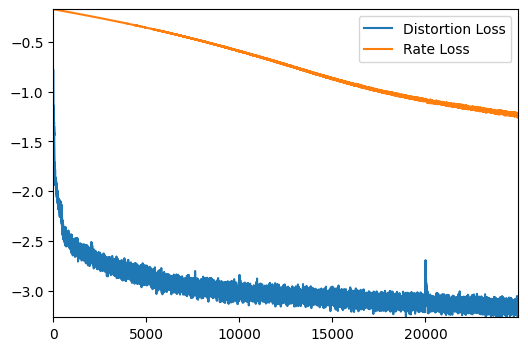

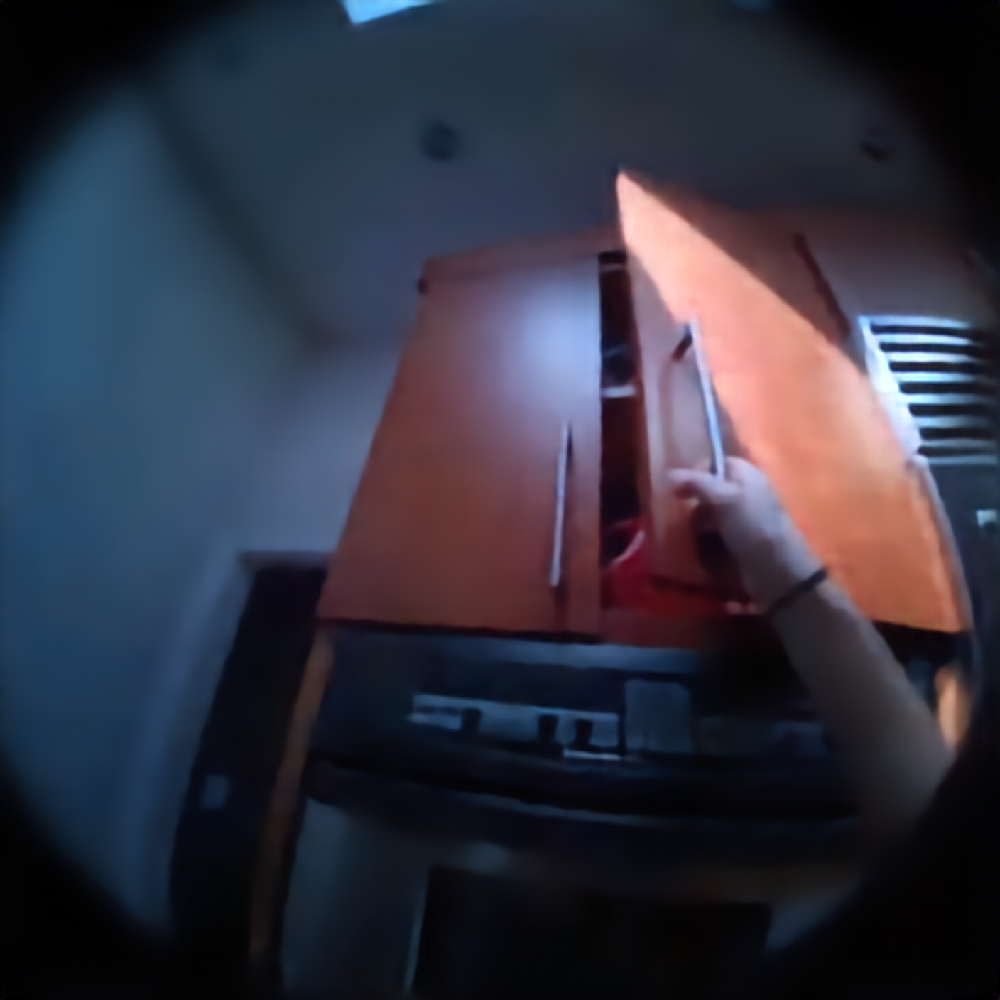

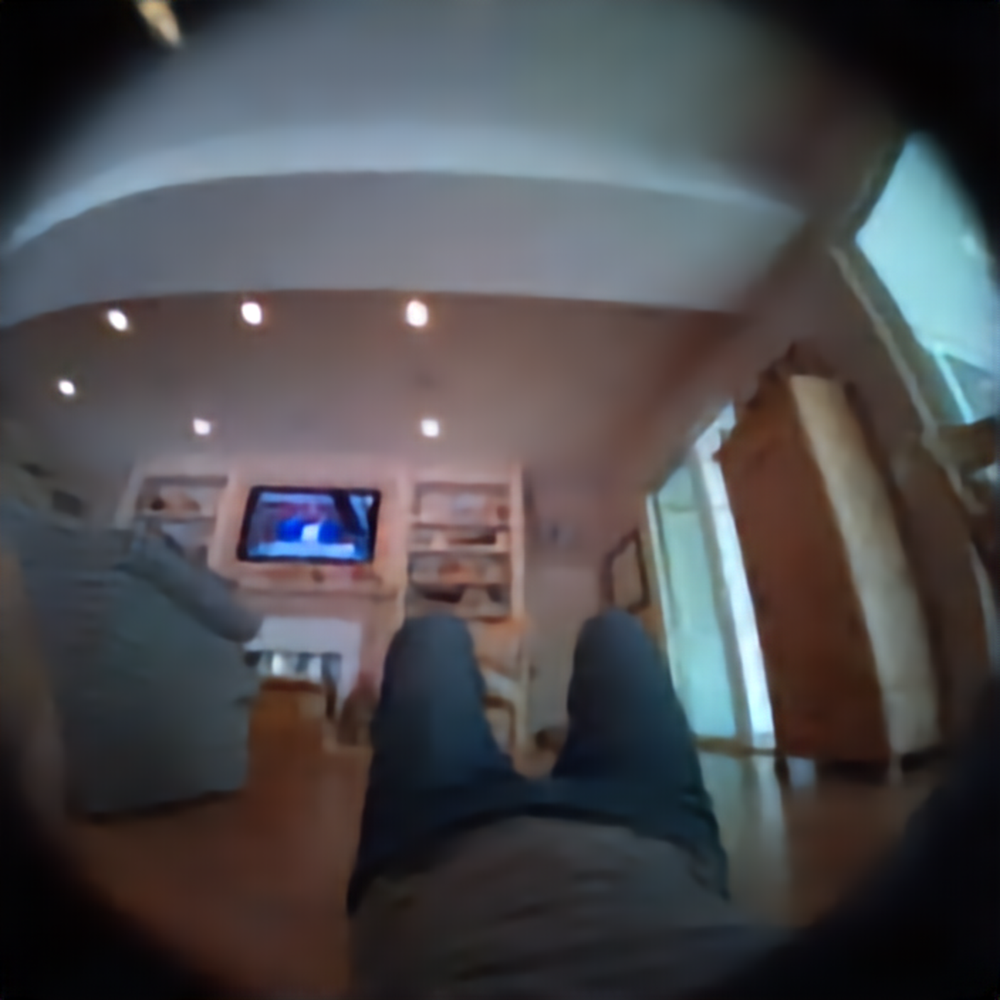

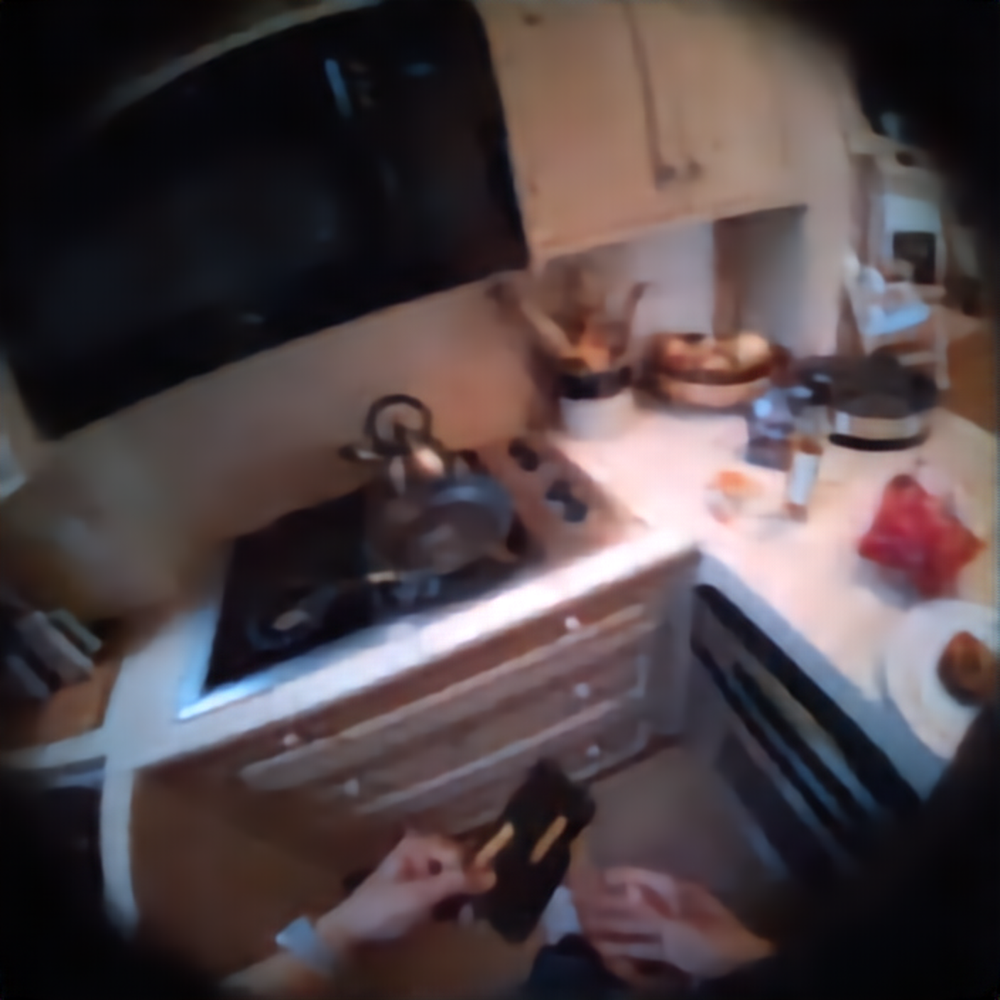

In [11]:
epochs = 5
mb = master_bar(range(epochs))
mb.names = ['Distortion Loss', 'Rate Loss']
dist_losses, rate_losses = [], []
img_displays = []
text_display = None
model.train()

desired_batch_size = 60
actual_batch_size = 20
accumulation_steps = desired_batch_size // actual_batch_size

for i_epoch in mb:
    dataloader = DataLoader(train_dataset, batch_size=actual_batch_size, shuffle=True, drop_last=True) 
    
    for i, batch in enumerate(progress_bar(dataloader, parent=mb)):

        x = batch['image'].to("cuda")
        x = x.to(torch.float)
        x = x/255
        x = x-0.5
        x = x.permute(0, 3, 1, 2)
        x = x.rot90(k=3,dims=[2,3])
        
        x_hat, y_likelihoods = model(x)

        N, _, H, W = x.size()
        num_pixels = N * H * W
        rate_loss = torch.log(y_likelihoods).sum() / (-torch.log(torch.tensor(2)) * num_pixels)
        dist_loss = F.mse_loss(x, x_hat)
        loss = dist_loss +  λ * rate_loss

        loss.backward()
        model.aux_loss().backward()
        if (i + 1) % accumulation_steps == 0: 
            optimizer.step()
            aux_optimizer.step()
            optimizer.zero_grad()
            aux_optimizer.zero_grad()

        dist_losses.append(np.log10(dist_loss.item()))
        rate_losses.append(np.log10(rate_loss.item()))
        
        if i % 15 == 0:
            mb.update_graph(
                [[range(len(dist_losses)), dist_losses], [range(len(rate_losses)), rate_losses]],
                [0, i_epoch*len(dataloader)+i+1],
                [min(min(dist_losses), min(rate_losses)), max(max(dist_losses), max(rate_losses))]
            )
            compressed, original_shape = compress(valid_batch)
            compression_ratio = 24/(8*len(compressed)/(valid_batch.shape[0]*H*W))
            status_text = f"compression ratio: {compression_ratio:.2f}"
            if text_display is None:
                text_display = display(HTML(status_text), display_id=True)
            else:
                update_display(HTML(status_text), display_id=text_display.display_id)
            x_hat_valid = decompress(compressed, original_shape)
            for img_idx, img in enumerate(x_hat_valid):
                buffer = io.BytesIO()
                pil(img + 0.5).save(buffer, format="PNG")
                pil(img + 0.5).save(f"video/{img_idx}_{i_epoch}_{i}.png")
                buffer.seek(0)
                if len(img_displays) <= img_idx:
                    img_displays.append(display(Image(buffer.read()), display_id=True))
                else:
                    update_display(Image(buffer.read()), display_id=img_displays[img_idx].display_id)
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'aux_optimizer_state_dict': aux_optimizer.state_dict(),
}, f"checkpoint.pth")